<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Load-model" data-toc-modified-id="Load-model-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Load model</a></span></li><li><span><a href="#SHAP" data-toc-modified-id="SHAP-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>SHAP</a></span><ul class="toc-item"><li><span><a href="#find-observations-linked-to-the-selected-allele" data-toc-modified-id="find-observations-linked-to-the-selected-allele-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>find observations linked to the selected allele</a></span><ul class="toc-item"><li><span><a href="#calculate-SHAP-values" data-toc-modified-id="calculate-SHAP-values-2.1.1"><span class="toc-item-num">2.1.1&nbsp;&nbsp;</span>calculate SHAP values</a></span></li><li><span><a href="#plot-mean-SHAP-values-per-AA-and-position" data-toc-modified-id="plot-mean-SHAP-values-per-AA-and-position-2.1.2"><span class="toc-item-num">2.1.2&nbsp;&nbsp;</span>plot mean SHAP values per AA and position</a></span></li><li><span><a href="#scatter-plot" data-toc-modified-id="scatter-plot-2.1.3"><span class="toc-item-num">2.1.3&nbsp;&nbsp;</span>scatter plot</a></span></li></ul></li></ul></li></ul></div>

In [1]:
import numpy as np
import pandas as pd
import pdb
from argparse import ArgumentParser
import shlex
from tqdm import tqdm

from pytorch_lightning import Trainer
from pytorch_lightning.callbacks import ModelCheckpoint

import pMHC
from pMHC import SEP, \
    SPLITS, SPLIT_TRAIN, SPLIT_VAL, SPLIT_TEST, \
    VIEWS, VIEW_SA, VIEW_SAMA, VIEW_DECONV, \
    INPUT_PEPTIDE, INPUT_CONTEXT
from pMHC.logic import PresentationPredictor
from pMHC.data import from_data, to_input
from pMHC.data.example import Observation, Decoy
from pMHC.data.mhc_allele import MhcAllele

tqdm.pandas()

In [2]:
from datetime import datetime

import torch

from pytorch_lightning.utilities.seed import seed_everything

import shap

import pMHC
from pMHC import POSITIVE_THRESHOLD, FLANK_LEN, MAX_PEPTIDE_LEN, VIEW_NAMES
from pMHC.logic.utils import load_latest, list_versions
from pMHC.data import pseudo_pos
from pMHC.data.utils import get_input_rep_PSEUDO, get_input_rep_FULL, \
    convert_example_to_batch, convert_examples_to_batch, move_dict_to_device
from pMHC.data.mhc_allele import MhcAllele
from pMHC.data.example import Sample, Peptide, Decoy
from pMHC.data.protein import Protein, generate_random_peptides
from pMHC.interpret.lime_based import MyExplainer
from pMHC.interpret.utils import show_MHC, get_alternative_predictions, \
    hydrophobic_aa, hydrophilic_aa
from pMHC.interpret.shap_based import example_to_array, array_to_example, shap_predict, shap_get_list

In [3]:
from pMHC.interpret.shap_based import shap_analyse_mhc_allele, plot_AA_pos
import matplotlib.pyplot as plt
from matplotlib.ticker import StrMethodFormatter

In [4]:
pMHC.set_paths(r"C:\Users\tux\Documents\MScProject")

Update project folder to: C:\Users\tux\Documents\MScProject
Load permutation


# Load model

In [5]:
version = "CONTEXT-PSEUDO-HEAD_Cls-DECOY_19-LR_0.00001"
checkpoint = "epoch=4-step=3648186"

In [6]:
MODEL_PATH = f"{pMHC.OUTPUT_FOLDER}{SEP}main{SEP}{version}{SEP}checkpoints{SEP}{checkpoint}.ckpt"
model = PresentationPredictor.load_from_checkpoint(MODEL_PATH, num_workers=0, 
                                                   name="mod", version="vers", shuffle_data=False,
                                                   output_attentions=False,
                                                   only_deconvolute=False
                                                  )

Global seed set to 42


In [7]:
model.setup()
# pMHC.data.from_input()

Global seed set to 42


PresentationPredictor.setup: 2021-08-14 20:31:28
MhcAllele.from_input


MhcAlleles from input: 11074it [00:00, 14232.37it/s]


Protein.from_input


Proteins from input: 185930it [00:11, 15880.88it/s]


Sample.from_input


Samples from input: 472it [00:00, 15116.46it/s]


Peptide.from_input


Peptides from input: 429339it [00:27, 15489.47it/s]


Observation.from_input


Observations from input: 1959736it [02:06, 15461.33it/s]
100%|████████████████████████████████████████████████████████████████████| 1959736/1959736 [00:08<00:00, 241732.46it/s]


Decoy.to_input
Load decoys for 1959737 observations
decoys_0_50000.csv
decoys_1000000_1050000.csv
decoys_100000_150000.csv
decoys_1050000_1100000.csv
decoys_1100000_1150000.csv
decoys_1150000_1200000.csv
decoys_1200000_1250000.csv
decoys_1250000_1300000.csv
decoys_1300000_1350000.csv
decoys_1350000_1400000.csv
decoys_1400000_1450000.csv
decoys_1450000_1500000.csv
decoys_1500000_1550000.csv
decoys_150000_200000.csv
decoys_1550000_1600000.csv
decoys_1600000_1650000.csv
decoys_1650000_1700000.csv
decoys_1700000_1750000.csv
decoys_1750000_1800000.csv
decoys_1800000_1850000.csv
decoys_1850000_1900000.csv
decoys_1900000_1950000.csv
decoys_1950000_2000000.csv
decoys_200000_250000.csv
decoys_250000_300000.csv
decoys_300000_350000.csv
decoys_350000_400000.csv
decoys_400000_450000.csv
decoys_450000_500000.csv
decoys_500000_550000.csv
decoys_50000_100000.csv
decoys_550000_600000.csv
decoys_600000_650000.csv
decoys_650000_700000.csv
decoys_700000_750000.csv
decoys_750000_800000.csv
decoys_800000_8

Global seed set to 42


PresentationPredictor.setup finished: 2021-08-14 20:41:49


Datasources

OBSERVATIONS                        /   MHC/Obs comb
   Edi                 :  1,550,250 /      7,209,446
   Atlas               :    409,486 /      2,436,897
   TOTAL               :  1,959,736 /      9,646,343




Splits

OBSERVATIONS                          SA            SAMA          Deconv
   train               :          205,591       1,407,876       6,734,816
   val                 :           33,920         274,378       1,299,848
   test                :           53,823         277,482       1,318,345
   val-prot            :           10,149          70,072         335,832
   test-prot           :           11,056          71,150         336,955
   val-mhc             :           23,771         204,306         964,016
   test-mhc            :           42,767         206,332         981,390



Dataloaders

EXAMPLES

   train               
      SA               :  4,111,820 /        128,494
      SAM

In [8]:
model.to("cuda");

# SHAP

## find observations linked to the selected allele

In [9]:
len_peptide = 9
num_observations = 500
decoys_per_obs = 1
nsamples=64
nbackground=256
mhc_allele_names = ["HLA-A33:01", "HLA-B54:01", "HLA-C01:02",     # selected
                    "HLA-A33:03", "HLA-A36:01", "HLA-A74:01", "HLA-B37:01", "HLA-B46:01",
                    "HLA-B58:01", "HLA-B58:02", "HLA-C15:02", "HLA-C17:01"
                   ]

### calculate SHAP values

In [15]:
for mhc_allele_name in mhc_allele_names:
    print(f"{mhc_allele_name}")
    
    orig_pred_list, orig_pred_wo_flanks_list, peptides_list, shap_values_list = \
            shap_analyse_mhc_allele(mhc_allele_name, model,
                                    len_peptide=len_peptide,
                                    num_obs=num_observations,
                                    decoys_per_obs=decoys_per_obs,
                                    nsamples=nsamples,
                                    nbackground=nbackground
                                   )
    

    
    df = pd.DataFrame({"orig_pred_list": orig_pred_list, "orig_pred_wo_flanks_list": orig_pred_wo_flanks_list, 
                       "peptides_list": peptides_list, "shap_values_list": shap_values_list})
    filename = f"{pMHC.OUTPUT_FOLDER}{SEP}shap{SEP}pics" \
                    + f"{SEP}shap_{mhc_allele_name.replace(':', '')}_{checkpoint}.csv"
    df.to_csv(f"{filename}", sep=",", index=False)        

Global seed set to 42


HLA-C17:01


  3%|██▏                                                                           | 28/1000 [14:41<8:27:22, 31.32s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  6%|████▍                                                                         | 57/1000 [29:49<8:12:44, 31.35s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  9%|██████▋                                                                       | 86/1000 [44:56<7:56:27, 31.28s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 12%|████████▋                                                                  | 115/1000 [1:00:04<7:41:55, 31.32s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 14%|██████████▊                                                                | 144/1000 [1:15:11<7:25:49, 31.25s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 17%|████████████▉                                                              | 173/1000 [1:30:21<7:11:47, 31.33s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 20%|███████████████▏                                                           | 202/1000 [1:45:28<6:55:31, 31.24s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 23%|█████████████████▎                                                         | 231/1000 [2:00:35<6:41:15, 31.31s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 26%|███████████████████▌                                                       | 260/1000 [2:15:41<6:25:07, 31.23s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 29%|█████████████████████▋                                                     | 289/1000 [2:30:48<6:10:29, 31.27s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 32%|███████████████████████▊                                                   | 318/1000 [2:45:55<5:55:06, 31.24s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 35%|██████████████████████████                                                 | 347/1000 [3:01:01<5:40:10, 31.26s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 38%|████████████████████████████▏                                              | 376/1000 [3:16:07<5:24:52, 31.24s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 40%|██████████████████████████████▍                                            | 405/1000 [3:31:13<5:09:54, 31.25s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 43%|████████████████████████████████▌                                          | 434/1000 [3:46:19<4:54:34, 31.23s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 46%|██████████████████████████████████▋                                        | 463/1000 [4:01:25<4:39:28, 31.23s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 49%|████████████████████████████████████▉                                      | 492/1000 [4:16:31<4:24:23, 31.23s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 52%|███████████████████████████████████████                                    | 521/1000 [4:31:38<4:09:20, 31.23s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 55%|█████████████████████████████████████████▎                                 | 550/1000 [4:46:44<3:54:20, 31.24s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 58%|███████████████████████████████████████████▍                               | 579/1000 [5:01:50<3:39:05, 31.23s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 61%|█████████████████████████████████████████████▌                             | 608/1000 [5:16:55<3:24:00, 31.23s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 64%|███████████████████████████████████████████████▊                           | 637/1000 [5:32:01<3:09:06, 31.26s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 67%|█████████████████████████████████████████████████▉                         | 666/1000 [5:47:07<2:53:56, 31.25s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 70%|████████████████████████████████████████████████████                       | 695/1000 [6:02:14<2:38:52, 31.25s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 72%|██████████████████████████████████████████████████████▎                    | 724/1000 [6:17:20<2:23:42, 31.24s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 75%|████████████████████████████████████████████████████████▍                  | 753/1000 [6:32:27<2:09:02, 31.35s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 78%|██████████████████████████████████████████████████████████▋                | 782/1000 [6:47:33<1:53:30, 31.24s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 81%|████████████████████████████████████████████████████████████▊              | 811/1000 [7:02:40<1:38:32, 31.28s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 84%|███████████████████████████████████████████████████████████████            | 840/1000 [7:17:48<1:23:22, 31.27s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 87%|█████████████████████████████████████████████████████████████████▏         | 869/1000 [7:32:56<1:08:22, 31.31s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 90%|█████████████████████████████████████████████████████████████████████▏       | 898/1000 [7:48:03<53:09, 31.27s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 93%|███████████████████████████████████████████████████████████████████████▍     | 927/1000 [8:03:16<38:05, 31.31s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 96%|█████████████████████████████████████████████████████████████████████████▌   | 956/1000 [8:18:53<24:33, 33.48s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 98%|███████████████████████████████████████████████████████████████████████████▊ | 985/1000 [8:34:10<07:55, 31.68s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


100%|████████████████████████████████████████████████████████████████████████████| 1000/1000 [8:42:02<00:00, 31.32s/it]


HLA-A33:03


Global seed set to 42
  3%|██▏                                                                           | 28/1000 [14:40<8:29:28, 31.45s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  6%|████▍                                                                         | 57/1000 [29:57<8:18:59, 31.75s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  9%|██████▋                                                                       | 86/1000 [45:24<8:02:36, 31.68s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 12%|████████▋                                                                  | 115/1000 [1:00:46<7:48:56, 31.79s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 14%|██████████▊                                                                | 144/1000 [1:16:06<7:32:38, 31.73s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 17%|████████████▉                                                              | 173/1000 [1:31:21<7:10:58, 31.27s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 20%|███████████████▏                                                           | 202/1000 [1:46:28<6:55:29, 31.24s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 23%|█████████████████▎                                                         | 231/1000 [2:01:34<6:40:31, 31.25s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 26%|███████████████████▌                                                       | 260/1000 [2:16:46<6:27:16, 31.40s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 29%|█████████████████████▋                                                     | 289/1000 [2:32:10<6:18:43, 31.96s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 32%|███████████████████████▊                                                   | 318/1000 [2:47:31<6:01:51, 31.83s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 35%|██████████████████████████                                                 | 347/1000 [3:02:52<5:44:59, 31.70s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 38%|████████████████████████████▏                                              | 376/1000 [3:18:14<5:32:12, 31.94s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 40%|██████████████████████████████▍                                            | 405/1000 [3:33:32<5:12:38, 31.53s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 43%|████████████████████████████████▌                                          | 434/1000 [3:48:45<4:56:09, 31.40s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 46%|██████████████████████████████████▋                                        | 463/1000 [4:04:00<4:43:33, 31.68s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 49%|████████████████████████████████████▉                                      | 492/1000 [4:19:22<4:28:43, 31.74s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 52%|███████████████████████████████████████                                    | 521/1000 [4:34:41<4:10:44, 31.41s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 55%|█████████████████████████████████████████▎                                 | 550/1000 [4:49:51<3:55:24, 31.39s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 58%|███████████████████████████████████████████▍                               | 579/1000 [5:05:01<3:39:54, 31.34s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 61%|█████████████████████████████████████████████▌                             | 608/1000 [5:20:11<3:24:58, 31.37s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 64%|███████████████████████████████████████████████▊                           | 637/1000 [5:35:21<3:09:39, 31.35s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 67%|█████████████████████████████████████████████████▉                         | 666/1000 [5:50:31<2:55:15, 31.48s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 70%|████████████████████████████████████████████████████                       | 695/1000 [6:05:40<2:39:20, 31.34s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 72%|██████████████████████████████████████████████████████▎                    | 724/1000 [6:20:57<2:25:10, 31.56s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 75%|████████████████████████████████████████████████████████▍                  | 753/1000 [6:36:08<2:09:16, 31.40s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 78%|██████████████████████████████████████████████████████████▋                | 782/1000 [6:51:19<1:54:02, 31.39s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 81%|████████████████████████████████████████████████████████████▊              | 811/1000 [7:06:30<1:38:54, 31.40s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 84%|███████████████████████████████████████████████████████████████            | 840/1000 [7:21:43<1:23:45, 31.41s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 87%|█████████████████████████████████████████████████████████████████▏         | 869/1000 [7:36:54<1:08:41, 31.46s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 90%|█████████████████████████████████████████████████████████████████████▏       | 898/1000 [7:52:07<53:32, 31.49s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 93%|███████████████████████████████████████████████████████████████████████▍     | 927/1000 [8:07:20<38:23, 31.55s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 96%|█████████████████████████████████████████████████████████████████████████▌   | 956/1000 [8:22:35<23:10, 31.59s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 98%|███████████████████████████████████████████████████████████████████████████▊ | 985/1000 [8:37:55<07:55, 31.71s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


100%|████████████████████████████████████████████████████████████████████████████| 1000/1000 [8:45:48<00:00, 31.55s/it]


HLA-A36:01


Global seed set to 42
  3%|██▏                                                                           | 28/1000 [14:40<8:29:21, 31.44s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  6%|████▍                                                                         | 57/1000 [30:00<8:20:12, 31.83s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  9%|██████▋                                                                       | 86/1000 [45:26<8:06:22, 31.93s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 12%|████████▋                                                                  | 115/1000 [1:00:55<7:54:15, 32.15s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 14%|██████████▊                                                                | 144/1000 [1:16:28<7:39:46, 32.23s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 17%|████████████▉                                                              | 173/1000 [1:31:53<7:19:11, 31.86s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 20%|███████████████▏                                                           | 202/1000 [1:47:14<7:00:18, 31.60s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 23%|█████████████████▎                                                         | 231/1000 [2:02:32<6:48:14, 31.85s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 26%|███████████████████▌                                                       | 260/1000 [2:18:04<6:38:31, 32.31s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 29%|█████████████████████▋                                                     | 289/1000 [2:33:42<6:27:05, 32.67s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 32%|███████████████████████▊                                                   | 318/1000 [2:49:07<5:56:37, 31.37s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 35%|██████████████████████████                                                 | 347/1000 [3:04:16<5:42:12, 31.44s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 38%|████████████████████████████▏                                              | 376/1000 [3:19:26<5:26:15, 31.37s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 40%|██████████████████████████████▍                                            | 405/1000 [3:34:38<5:11:56, 31.46s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 43%|████████████████████████████████▌                                          | 434/1000 [3:49:48<4:56:08, 31.39s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 46%|██████████████████████████████████▋                                        | 463/1000 [4:05:00<4:41:24, 31.44s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 49%|████████████████████████████████████▉                                      | 492/1000 [4:20:11<4:26:04, 31.43s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 52%|███████████████████████████████████████                                    | 521/1000 [4:35:26<4:10:55, 31.43s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 55%|█████████████████████████████████████████▎                                 | 550/1000 [4:50:41<3:56:26, 31.53s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 58%|███████████████████████████████████████████▍                               | 579/1000 [5:05:55<3:41:29, 31.57s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 61%|█████████████████████████████████████████████▌                             | 608/1000 [5:21:09<3:25:51, 31.51s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 64%|███████████████████████████████████████████████▊                           | 637/1000 [5:36:32<3:12:24, 31.80s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 67%|█████████████████████████████████████████████████▉                         | 666/1000 [5:51:53<2:54:59, 31.44s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 70%|████████████████████████████████████████████████████                       | 695/1000 [6:07:04<2:39:30, 31.38s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 72%|██████████████████████████████████████████████████████▎                    | 724/1000 [6:22:12<2:24:16, 31.36s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 75%|████████████████████████████████████████████████████████▍                  | 753/1000 [6:37:20<2:08:43, 31.27s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 78%|██████████████████████████████████████████████████████████▋                | 782/1000 [6:52:27<1:53:45, 31.31s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 81%|████████████████████████████████████████████████████████████▊              | 811/1000 [7:07:36<1:38:39, 31.32s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 84%|███████████████████████████████████████████████████████████████            | 840/1000 [7:22:44<1:23:31, 31.32s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 87%|█████████████████████████████████████████████████████████████████▏         | 869/1000 [7:37:54<1:08:19, 31.30s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 90%|█████████████████████████████████████████████████████████████████████▏       | 898/1000 [7:53:02<53:16, 31.34s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 93%|███████████████████████████████████████████████████████████████████████▍     | 927/1000 [8:08:10<38:05, 31.31s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 96%|█████████████████████████████████████████████████████████████████████████▌   | 956/1000 [8:23:17<22:57, 31.30s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 98%|███████████████████████████████████████████████████████████████████████████▊ | 985/1000 [8:38:24<07:49, 31.28s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


100%|████████████████████████████████████████████████████████████████████████████| 1000/1000 [8:46:13<00:00, 31.57s/it]


HLA-A74:01


Global seed set to 42
  3%|██▏                                                                           | 28/1000 [14:34<8:25:51, 31.23s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  6%|████▍                                                                         | 57/1000 [29:41<8:10:52, 31.23s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  9%|██████▋                                                                       | 86/1000 [44:47<7:55:32, 31.22s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 12%|████████▊                                                                    | 115/1000 [59:53<7:40:22, 31.21s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 14%|██████████▊                                                                | 144/1000 [1:14:58<7:25:11, 31.21s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 17%|████████████▉                                                              | 173/1000 [1:30:05<7:10:51, 31.26s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 20%|███████████████▏                                                           | 202/1000 [1:45:10<6:56:36, 31.32s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 23%|█████████████████▎                                                         | 231/1000 [2:00:15<6:39:41, 31.18s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 26%|███████████████████▌                                                       | 260/1000 [2:15:21<6:25:12, 31.23s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 29%|█████████████████████▋                                                     | 289/1000 [2:30:26<6:09:28, 31.18s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 32%|███████████████████████▊                                                   | 318/1000 [2:45:31<5:55:25, 31.27s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 35%|██████████████████████████                                                 | 347/1000 [3:00:37<5:40:07, 31.25s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 38%|████████████████████████████▏                                              | 376/1000 [3:15:43<5:25:31, 31.30s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 40%|██████████████████████████████▍                                            | 405/1000 [3:30:50<5:09:52, 31.25s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 43%|████████████████████████████████▌                                          | 434/1000 [3:45:56<4:55:08, 31.29s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 46%|██████████████████████████████████▋                                        | 463/1000 [4:01:03<4:39:34, 31.24s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 49%|████████████████████████████████████▉                                      | 492/1000 [4:16:11<4:25:08, 31.32s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 52%|███████████████████████████████████████                                    | 521/1000 [4:31:20<4:10:14, 31.35s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 55%|█████████████████████████████████████████▎                                 | 550/1000 [4:46:29<3:55:18, 31.37s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 58%|███████████████████████████████████████████▍                               | 579/1000 [5:01:38<3:39:48, 31.33s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 61%|█████████████████████████████████████████████▌                             | 608/1000 [5:16:47<3:24:21, 31.28s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 64%|███████████████████████████████████████████████▊                           | 637/1000 [5:31:53<3:08:52, 31.22s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 67%|█████████████████████████████████████████████████▉                         | 666/1000 [5:47:21<2:54:31, 31.35s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 70%|████████████████████████████████████████████████████                       | 695/1000 [6:02:31<2:39:43, 31.42s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 72%|██████████████████████████████████████████████████████▎                    | 724/1000 [6:17:41<2:23:57, 31.29s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 75%|████████████████████████████████████████████████████████▍                  | 753/1000 [6:32:58<2:09:38, 31.49s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 78%|██████████████████████████████████████████████████████████▋                | 782/1000 [6:48:08<1:53:50, 31.33s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 81%|████████████████████████████████████████████████████████████▊              | 811/1000 [7:03:16<1:38:34, 31.29s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 84%|███████████████████████████████████████████████████████████████            | 840/1000 [7:18:28<1:23:36, 31.35s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 87%|█████████████████████████████████████████████████████████████████▏         | 869/1000 [7:33:37<1:08:29, 31.37s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 90%|█████████████████████████████████████████████████████████████████████▏       | 898/1000 [7:48:48<53:22, 31.40s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 93%|███████████████████████████████████████████████████████████████████████▍     | 927/1000 [8:03:59<38:11, 31.39s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 96%|█████████████████████████████████████████████████████████████████████████▌   | 956/1000 [8:19:10<23:02, 31.43s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 98%|███████████████████████████████████████████████████████████████████████████▊ | 985/1000 [8:34:20<07:50, 31.39s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


100%|████████████████████████████████████████████████████████████████████████████| 1000/1000 [8:42:11<00:00, 31.33s/it]


HLA-B37:01


Global seed set to 42
  3%|██▏                                                                           | 28/1000 [14:40<8:29:29, 31.45s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  6%|████▍                                                                         | 57/1000 [29:51<8:13:56, 31.43s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  9%|██████▋                                                                       | 86/1000 [45:03<7:58:21, 31.40s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 12%|████████▋                                                                  | 115/1000 [1:00:13<7:42:56, 31.39s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 14%|██████████▊                                                                | 144/1000 [1:15:23<7:28:10, 31.41s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 17%|████████████▉                                                              | 173/1000 [1:30:35<7:12:24, 31.37s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 20%|███████████████▏                                                           | 202/1000 [1:45:46<6:57:50, 31.42s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 23%|█████████████████▎                                                         | 231/1000 [2:00:57<6:42:31, 31.41s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 26%|███████████████████▌                                                       | 260/1000 [2:16:07<6:27:00, 31.38s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 29%|█████████████████████▋                                                     | 289/1000 [2:31:17<6:11:57, 31.39s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 32%|███████████████████████▊                                                   | 318/1000 [2:46:28<5:57:11, 31.42s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 35%|██████████████████████████                                                 | 347/1000 [3:01:40<5:42:16, 31.45s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 38%|████████████████████████████▏                                              | 376/1000 [3:16:53<5:28:38, 31.60s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 40%|██████████████████████████████▍                                            | 405/1000 [3:32:21<5:18:29, 32.12s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 43%|████████████████████████████████▌                                          | 434/1000 [3:47:35<4:56:32, 31.44s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 46%|██████████████████████████████████▋                                        | 463/1000 [4:02:54<4:46:08, 31.97s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 49%|████████████████████████████████████▉                                      | 492/1000 [4:18:22<4:28:45, 31.74s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 52%|███████████████████████████████████████                                    | 521/1000 [4:35:41<4:47:26, 36.00s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 55%|█████████████████████████████████████████▎                                 | 550/1000 [4:51:40<4:12:54, 33.72s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 58%|███████████████████████████████████████████▍                               | 579/1000 [5:07:12<3:45:36, 32.15s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 61%|█████████████████████████████████████████████▌                             | 608/1000 [5:23:01<3:29:32, 32.07s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 64%|███████████████████████████████████████████████▊                           | 637/1000 [5:38:54<3:19:19, 32.95s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 67%|█████████████████████████████████████████████████▉                         | 666/1000 [5:54:49<3:01:10, 32.55s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 70%|████████████████████████████████████████████████████                       | 695/1000 [6:10:27<2:41:39, 31.80s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 72%|██████████████████████████████████████████████████████▎                    | 724/1000 [6:26:10<2:30:01, 32.61s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 75%|████████████████████████████████████████████████████████▍                  | 753/1000 [6:41:55<2:14:23, 32.65s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 78%|██████████████████████████████████████████████████████████▋                | 782/1000 [6:57:36<1:55:42, 31.85s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 81%|████████████████████████████████████████████████████████████▊              | 811/1000 [7:13:03<1:41:34, 32.25s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 84%|███████████████████████████████████████████████████████████████            | 840/1000 [7:28:32<1:24:54, 31.84s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 87%|█████████████████████████████████████████████████████████████████▏         | 869/1000 [7:43:51<1:08:59, 31.60s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 90%|█████████████████████████████████████████████████████████████████████▏       | 898/1000 [7:59:05<53:30, 31.48s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 93%|███████████████████████████████████████████████████████████████████████▍     | 927/1000 [8:14:18<38:18, 31.49s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 96%|█████████████████████████████████████████████████████████████████████████▌   | 956/1000 [8:29:29<23:03, 31.43s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 98%|███████████████████████████████████████████████████████████████████████████▊ | 985/1000 [8:44:40<07:51, 31.41s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


100%|████████████████████████████████████████████████████████████████████████████| 1000/1000 [8:52:33<00:00, 31.95s/it]


HLA-B46:01


Global seed set to 42
  3%|██▏                                                                           | 28/1000 [14:56<8:36:23, 31.88s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  6%|████▍                                                                         | 57/1000 [30:19<8:19:30, 31.78s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  9%|██████▋                                                                       | 86/1000 [45:42<8:04:44, 31.82s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 12%|████████▋                                                                  | 115/1000 [1:01:02<7:48:21, 31.75s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 14%|██████████▊                                                                | 144/1000 [1:16:24<7:31:50, 31.67s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 17%|████████████▉                                                              | 173/1000 [1:31:42<7:16:44, 31.69s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 20%|███████████████▏                                                           | 202/1000 [1:47:06<7:08:02, 32.18s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 23%|█████████████████▎                                                         | 231/1000 [2:02:34<6:46:55, 31.75s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 26%|███████████████████▌                                                       | 260/1000 [2:17:49<6:30:04, 31.63s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 29%|█████████████████████▋                                                     | 289/1000 [2:33:03<6:13:02, 31.48s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 32%|███████████████████████▊                                                   | 318/1000 [2:48:15<5:57:57, 31.49s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 35%|██████████████████████████                                                 | 347/1000 [3:03:28<5:42:45, 31.49s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 38%|████████████████████████████▏                                              | 376/1000 [3:18:41<5:28:20, 31.57s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 40%|██████████████████████████████▍                                            | 405/1000 [3:33:53<5:12:53, 31.55s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 43%|████████████████████████████████▌                                          | 434/1000 [3:49:07<4:57:33, 31.54s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 46%|██████████████████████████████████▋                                        | 463/1000 [4:04:23<4:42:17, 31.54s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 49%|████████████████████████████████████▉                                      | 492/1000 [4:19:38<4:27:07, 31.55s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 52%|███████████████████████████████████████                                    | 521/1000 [4:34:55<4:12:17, 31.60s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 55%|█████████████████████████████████████████▎                                 | 550/1000 [4:50:12<3:57:06, 31.62s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 58%|███████████████████████████████████████████▍                               | 579/1000 [5:05:29<3:41:53, 31.62s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 61%|█████████████████████████████████████████████▌                             | 608/1000 [5:20:47<3:27:07, 31.70s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 64%|███████████████████████████████████████████████▊                           | 637/1000 [5:36:03<3:11:13, 31.61s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 67%|█████████████████████████████████████████████████▉                         | 666/1000 [5:51:20<2:56:12, 31.65s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 70%|████████████████████████████████████████████████████                       | 695/1000 [6:06:38<2:40:50, 31.64s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 72%|██████████████████████████████████████████████████████▎                    | 724/1000 [6:21:56<2:25:52, 31.71s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 75%|████████████████████████████████████████████████████████▍                  | 753/1000 [6:37:15<2:10:59, 31.82s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 78%|██████████████████████████████████████████████████████████▋                | 782/1000 [6:52:33<1:55:02, 31.66s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 81%|████████████████████████████████████████████████████████████▊              | 811/1000 [7:07:51<1:39:42, 31.65s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 84%|███████████████████████████████████████████████████████████████            | 840/1000 [7:23:10<1:24:32, 31.70s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 87%|█████████████████████████████████████████████████████████████████▏         | 869/1000 [7:38:29<1:09:09, 31.67s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 90%|█████████████████████████████████████████████████████████████████████▏       | 898/1000 [7:53:48<53:50, 31.67s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 93%|███████████████████████████████████████████████████████████████████████▍     | 927/1000 [8:09:06<38:32, 31.68s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 96%|█████████████████████████████████████████████████████████████████████████▌   | 956/1000 [8:24:24<23:11, 31.63s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 98%|███████████████████████████████████████████████████████████████████████████▊ | 985/1000 [8:39:42<07:54, 31.64s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


100%|████████████████████████████████████████████████████████████████████████████| 1000/1000 [8:47:37<00:00, 31.66s/it]


HLA-B58:01


Global seed set to 42
  3%|██▏                                                                           | 28/1000 [14:46<8:33:09, 31.68s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  6%|████▍                                                                         | 57/1000 [30:06<8:21:51, 31.93s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  9%|██████▋                                                                       | 86/1000 [45:24<8:02:14, 31.66s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 12%|████████▋                                                                  | 115/1000 [1:00:42<7:47:07, 31.67s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 14%|██████████▊                                                                | 144/1000 [1:16:01<7:32:20, 31.71s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 17%|████████████▉                                                              | 173/1000 [1:31:20<7:16:06, 31.64s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 20%|███████████████▏                                                           | 202/1000 [1:46:38<7:00:37, 31.63s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 23%|█████████████████▎                                                         | 231/1000 [2:01:59<7:00:13, 32.79s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 26%|███████████████████▌                                                       | 260/1000 [2:17:36<6:43:22, 32.71s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 29%|█████████████████████▋                                                     | 289/1000 [2:33:23<6:20:18, 32.09s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 32%|███████████████████████▊                                                   | 318/1000 [2:48:46<5:58:21, 31.53s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 35%|██████████████████████████                                                 | 347/1000 [3:03:58<5:42:50, 31.50s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 38%|████████████████████████████▏                                              | 376/1000 [3:19:11<5:27:28, 31.49s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 40%|██████████████████████████████▍                                            | 405/1000 [3:34:30<5:14:09, 31.68s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 43%|████████████████████████████████▌                                          | 434/1000 [3:49:48<4:58:48, 31.68s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 46%|██████████████████████████████████▋                                        | 463/1000 [4:05:07<4:43:57, 31.73s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 49%|████████████████████████████████████▉                                      | 492/1000 [4:20:30<4:29:25, 31.82s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 52%|███████████████████████████████████████                                    | 521/1000 [4:35:53<4:14:14, 31.85s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 55%|█████████████████████████████████████████▎                                 | 550/1000 [4:51:16<3:58:40, 31.82s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 58%|███████████████████████████████████████████▍                               | 579/1000 [5:06:40<3:43:32, 31.86s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 61%|█████████████████████████████████████████████▌                             | 608/1000 [5:22:03<3:27:57, 31.83s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 64%|███████████████████████████████████████████████▊                           | 637/1000 [5:37:28<3:12:55, 31.89s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 67%|█████████████████████████████████████████████████▉                         | 666/1000 [5:52:53<2:57:53, 31.96s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 70%|████████████████████████████████████████████████████                       | 695/1000 [6:08:18<2:41:57, 31.86s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 72%|██████████████████████████████████████████████████████▎                    | 724/1000 [6:23:44<2:26:58, 31.95s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 75%|████████████████████████████████████████████████████████▍                  | 753/1000 [6:39:23<2:12:57, 32.30s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 78%|██████████████████████████████████████████████████████████▋                | 782/1000 [6:55:06<1:59:08, 32.79s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 81%|████████████████████████████████████████████████████████████▊              | 811/1000 [7:11:00<1:41:58, 32.37s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 84%|███████████████████████████████████████████████████████████████            | 840/1000 [7:26:33<1:25:05, 31.91s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 87%|█████████████████████████████████████████████████████████████████▏         | 869/1000 [7:42:16<1:10:56, 32.49s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 90%|█████████████████████████████████████████████████████████████████████▏       | 898/1000 [7:57:41<54:01, 31.78s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 93%|███████████████████████████████████████████████████████████████████████▍     | 927/1000 [8:13:01<38:43, 31.82s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 96%|█████████████████████████████████████████████████████████████████████████▌   | 956/1000 [8:28:37<23:45, 32.40s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 98%|███████████████████████████████████████████████████████████████████████████▊ | 985/1000 [8:44:15<07:57, 31.84s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


100%|████████████████████████████████████████████████████████████████████████████| 1000/1000 [8:52:12<00:00, 31.93s/it]


HLA-B58:02


Global seed set to 42
  3%|██▏                                                                           | 28/1000 [15:06<8:49:47, 32.70s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  6%|████▍                                                                         | 57/1000 [30:38<8:25:47, 32.18s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  9%|██████▋                                                                       | 86/1000 [46:12<8:12:29, 32.33s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 12%|████████▋                                                                  | 115/1000 [1:01:51<7:59:34, 32.51s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 14%|██████████▊                                                                | 144/1000 [1:17:51<7:47:33, 32.77s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 17%|████████████▉                                                              | 173/1000 [1:36:33<9:14:23, 40.22s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 20%|███████████████▏                                                           | 202/1000 [1:55:00<7:27:05, 33.62s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 23%|█████████████████▎                                                         | 231/1000 [2:10:31<6:49:20, 31.94s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 26%|███████████████████▌                                                       | 260/1000 [2:25:55<6:32:53, 31.86s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 29%|█████████████████████▋                                                     | 289/1000 [2:41:21<6:18:33, 31.95s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 32%|███████████████████████▊                                                   | 318/1000 [2:56:45<6:01:45, 31.83s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 35%|██████████████████████████                                                 | 347/1000 [3:12:06<5:45:13, 31.72s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 38%|████████████████████████████▏                                              | 376/1000 [3:27:31<5:31:26, 31.87s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 40%|██████████████████████████████▍                                            | 405/1000 [3:42:51<5:14:29, 31.71s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 43%|████████████████████████████████▌                                          | 434/1000 [3:58:10<4:58:35, 31.65s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 46%|██████████████████████████████████▋                                        | 463/1000 [4:13:28<4:42:29, 31.56s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 49%|████████████████████████████████████▉                                      | 492/1000 [4:28:44<4:27:19, 31.57s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 52%|███████████████████████████████████████                                    | 521/1000 [4:44:01<4:12:22, 31.61s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 55%|█████████████████████████████████████████▎                                 | 550/1000 [4:59:19<3:57:08, 31.62s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 58%|███████████████████████████████████████████▍                               | 579/1000 [5:14:37<3:41:52, 31.62s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 61%|█████████████████████████████████████████████▌                             | 608/1000 [5:29:54<3:26:24, 31.59s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 64%|███████████████████████████████████████████████▊                           | 637/1000 [5:45:11<3:11:31, 31.66s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 67%|█████████████████████████████████████████████████▉                         | 666/1000 [6:00:28<2:55:56, 31.61s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 70%|████████████████████████████████████████████████████                       | 695/1000 [6:15:49<2:41:46, 31.82s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 72%|██████████████████████████████████████████████████████▎                    | 724/1000 [6:31:10<2:26:10, 31.78s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 75%|████████████████████████████████████████████████████████▍                  | 753/1000 [6:46:30<2:10:32, 31.71s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 78%|██████████████████████████████████████████████████████████▋                | 782/1000 [7:01:48<1:54:52, 31.62s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 81%|████████████████████████████████████████████████████████████▊              | 811/1000 [7:17:05<1:39:25, 31.56s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 84%|███████████████████████████████████████████████████████████████            | 840/1000 [7:32:20<1:24:10, 31.57s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 87%|█████████████████████████████████████████████████████████████████▏         | 869/1000 [7:47:37<1:09:01, 31.61s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 90%|█████████████████████████████████████████████████████████████████████▏       | 898/1000 [8:02:54<53:46, 31.63s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 93%|███████████████████████████████████████████████████████████████████████▍     | 927/1000 [8:18:37<39:19, 32.33s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 96%|█████████████████████████████████████████████████████████████████████████▌   | 956/1000 [8:34:16<23:36, 32.20s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 98%|███████████████████████████████████████████████████████████████████████████▊ | 985/1000 [8:49:39<07:53, 31.57s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


100%|████████████████████████████████████████████████████████████████████████████| 1000/1000 [8:57:33<00:00, 32.25s/it]


HLA-C15:02


Global seed set to 42
  3%|██▏                                                                           | 28/1000 [14:47<8:33:22, 31.69s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  6%|████▍                                                                         | 57/1000 [30:01<8:15:34, 31.53s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  9%|██████▋                                                                       | 86/1000 [45:15<8:00:23, 31.54s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 12%|████████▋                                                                  | 115/1000 [1:00:33<7:46:34, 31.63s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 14%|██████████▊                                                                | 144/1000 [1:15:48<7:30:12, 31.56s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 17%|████████████▉                                                              | 173/1000 [1:31:02<7:14:20, 31.51s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 20%|███████████████▏                                                           | 202/1000 [1:46:17<6:59:27, 31.54s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 23%|█████████████████▎                                                         | 231/1000 [2:01:32<6:44:11, 31.54s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 26%|███████████████████▌                                                       | 260/1000 [2:16:46<6:28:25, 31.49s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 29%|█████████████████████▋                                                     | 289/1000 [2:31:58<6:12:40, 31.45s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 32%|███████████████████████▊                                                   | 318/1000 [2:47:11<5:57:28, 31.45s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 35%|██████████████████████████                                                 | 347/1000 [3:02:23<5:42:00, 31.42s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 38%|████████████████████████████▏                                              | 376/1000 [3:17:35<5:27:08, 31.46s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 40%|██████████████████████████████▍                                            | 405/1000 [3:32:48<5:11:44, 31.44s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 43%|████████████████████████████████▌                                          | 434/1000 [3:48:00<4:56:22, 31.42s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 46%|██████████████████████████████████▋                                        | 463/1000 [4:03:12<4:41:29, 31.45s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 49%|████████████████████████████████████▉                                      | 492/1000 [4:18:23<4:25:58, 31.42s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 52%|███████████████████████████████████████                                    | 521/1000 [4:33:36<4:11:12, 31.47s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 55%|█████████████████████████████████████████▎                                 | 550/1000 [4:48:48<3:55:49, 31.44s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 58%|███████████████████████████████████████████▍                               | 579/1000 [5:04:00<3:40:49, 31.47s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 61%|█████████████████████████████████████████████▌                             | 608/1000 [5:19:11<3:25:15, 31.42s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 64%|███████████████████████████████████████████████▊                           | 637/1000 [5:34:22<3:09:59, 31.40s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 67%|█████████████████████████████████████████████████▉                         | 666/1000 [5:49:33<2:55:09, 31.47s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 70%|████████████████████████████████████████████████████                       | 695/1000 [6:04:43<2:39:42, 31.42s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 72%|██████████████████████████████████████████████████████▎                    | 724/1000 [6:19:55<2:24:33, 31.43s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 75%|████████████████████████████████████████████████████████▍                  | 753/1000 [6:35:06<2:09:02, 31.34s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 78%|██████████████████████████████████████████████████████████▋                | 782/1000 [6:50:15<1:54:12, 31.43s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 81%|████████████████████████████████████████████████████████████▊              | 811/1000 [7:05:26<1:38:53, 31.39s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 84%|███████████████████████████████████████████████████████████████            | 840/1000 [7:20:37<1:23:41, 31.38s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 87%|█████████████████████████████████████████████████████████████████▏         | 869/1000 [7:35:48<1:08:33, 31.40s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 90%|█████████████████████████████████████████████████████████████████████▏       | 898/1000 [7:50:59<53:25, 31.43s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 93%|███████████████████████████████████████████████████████████████████████▍     | 927/1000 [8:06:11<38:24, 31.56s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 96%|█████████████████████████████████████████████████████████████████████████▌   | 956/1000 [8:21:26<23:28, 32.01s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


 98%|███████████████████████████████████████████████████████████████████████████▊ | 985/1000 [8:36:43<07:53, 31.55s/it]Using 256 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


100%|████████████████████████████████████████████████████████████████████████████| 1000/1000 [8:44:35<00:00, 31.48s/it]


### plot mean SHAP values per AA and position

In [11]:
import seaborn as sns

In [12]:
sns.set_style("whitegrid")

HLA-A33:01



HLA-A33:01 - all


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


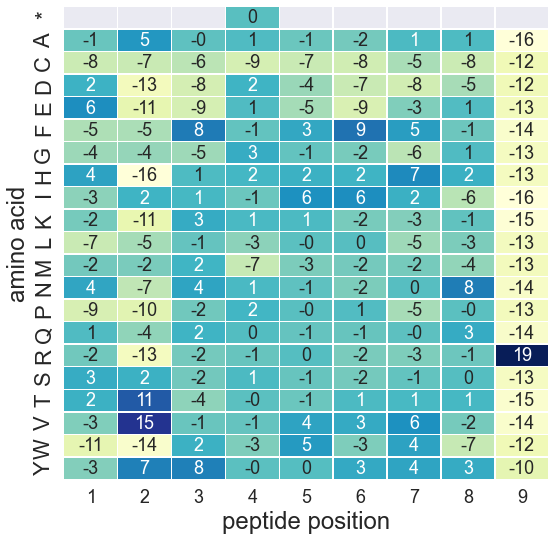

              1      2      3      4      5      6     7      8      9
H-phobic -0.051 -0.021  0.005 -0.012  0.015  0.011 -0.00 -0.024 -0.138
H-philic  0.007 -0.055 -0.013 -0.002 -0.015 -0.026 -0.01  0.003 -0.102



HLA-A33:01 - hits


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


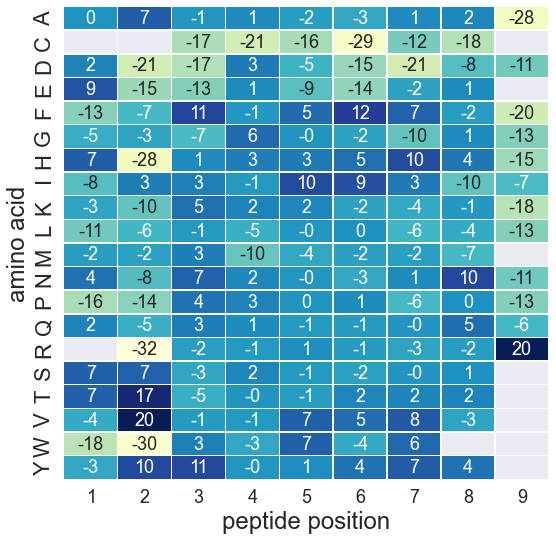

              1      2      3      4      5      6      7      8      9
H-phobic -0.086 -0.034  0.015 -0.013  0.026  0.019  0.001 -0.026 -0.159
H-philic  0.036 -0.084 -0.028 -0.008 -0.025 -0.052 -0.020 -0.001 -0.069



HLA-A33:01 - decoys


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


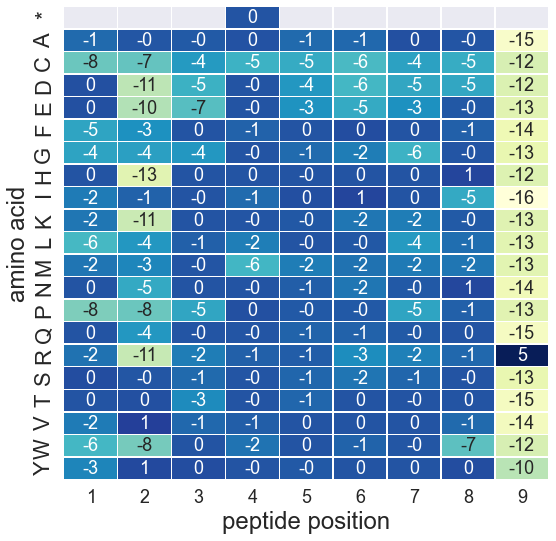

              1      2      3      4      5      6      7      8      9
H-phobic -0.041 -0.032 -0.012 -0.014 -0.005 -0.006 -0.018 -0.020 -0.137
H-philic -0.012 -0.064 -0.020 -0.006 -0.015 -0.024 -0.017 -0.009 -0.113
HLA-B54:01



HLA-B54:01 - all


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


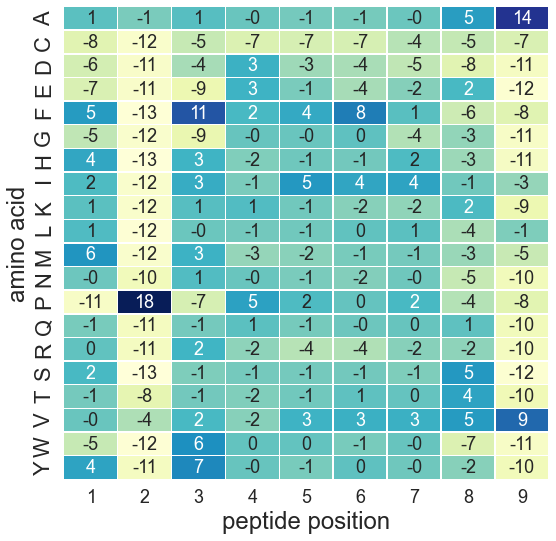

              1      2      3      4      5      6      7      8      9
H-phobic -0.008 -0.067  0.011  0.000  0.011  0.014  0.006 -0.019 -0.027
H-philic -0.011 -0.110 -0.006 -0.006 -0.019 -0.021 -0.015 -0.011 -0.102



HLA-B54:01 - hits


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


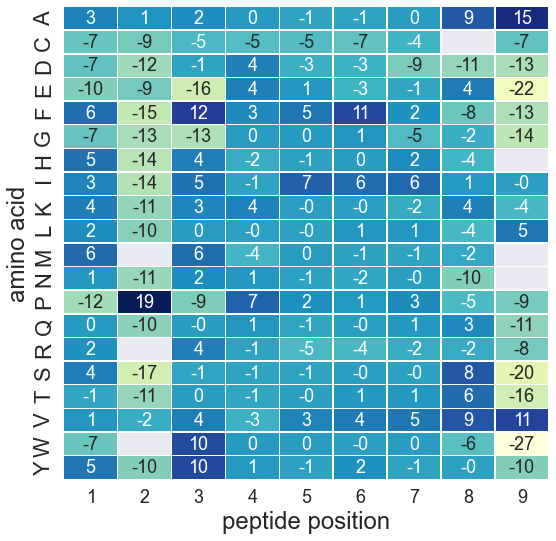

              1      2      3      4      5      6      7      8      9
H-phobic -0.006 -0.048  0.019  0.003  0.019  0.024  0.011 -0.010 -0.039
H-philic -0.004 -0.114  0.001  0.003 -0.014 -0.016 -0.014 -0.001 -0.124



HLA-B54:01 - decoys


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


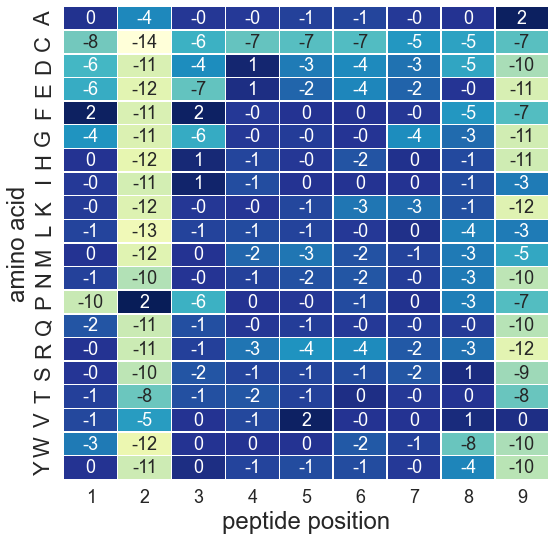

              1      2      3      4      5      6      7      8      9
H-phobic -0.020 -0.086 -0.011 -0.008 -0.004 -0.007 -0.006 -0.028 -0.049
H-philic -0.021 -0.110 -0.019 -0.013 -0.021 -0.025 -0.016 -0.021 -0.099
HLA-C01:02



HLA-C01:02 - all


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


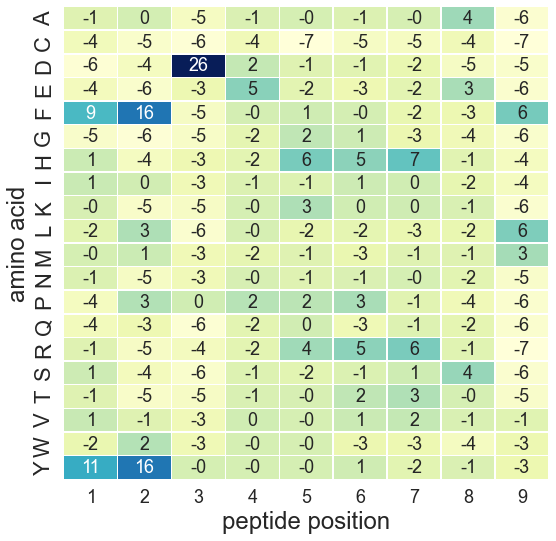

              1      2      3      4      5      6      7      8      9
H-phobic -0.004  0.019 -0.037 -0.003 -0.001 -0.003 -0.012 -0.018 -0.012
H-philic -0.009 -0.028 -0.014 -0.004 -0.000 -0.001  0.005 -0.008 -0.054



HLA-C01:02 - hits


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


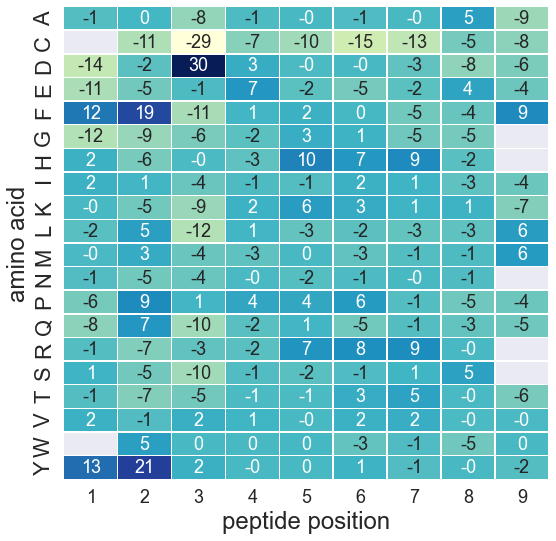

              1      2      3      4      5      6      7      8      9
H-phobic -0.007  0.036 -0.047 -0.000  0.004  0.002 -0.015 -0.022  0.004
H-philic -0.020 -0.023 -0.035 -0.005  0.007 -0.005  0.003 -0.008 -0.054



HLA-C01:02 - decoys


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


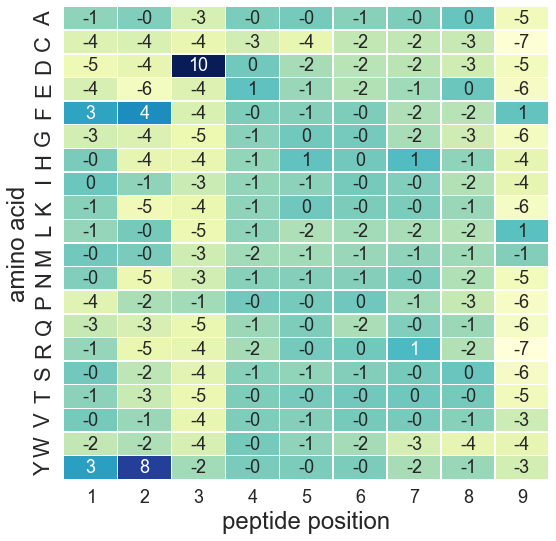

              1      2      3      4      5      6      7      8      9
H-phobic -0.010 -0.007 -0.035 -0.006 -0.007 -0.006 -0.013 -0.019 -0.030
H-philic -0.014 -0.030 -0.026 -0.008 -0.008 -0.009 -0.006 -0.012 -0.054
HLA-A33:03



HLA-A33:03 - all


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


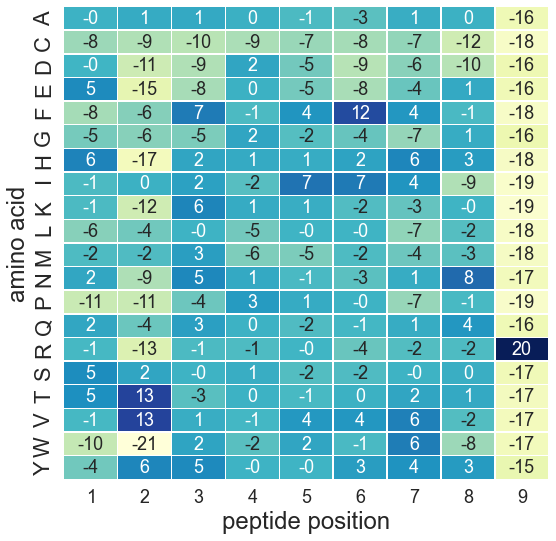

              1      2      3      4     5      6      7      8      9
H-phobic -0.049 -0.040  0.007 -0.013  0.01  0.015 -0.005 -0.028 -0.176
H-philic  0.008 -0.063 -0.009 -0.004 -0.02 -0.029 -0.008 -0.001 -0.137



HLA-A33:03 - hits


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


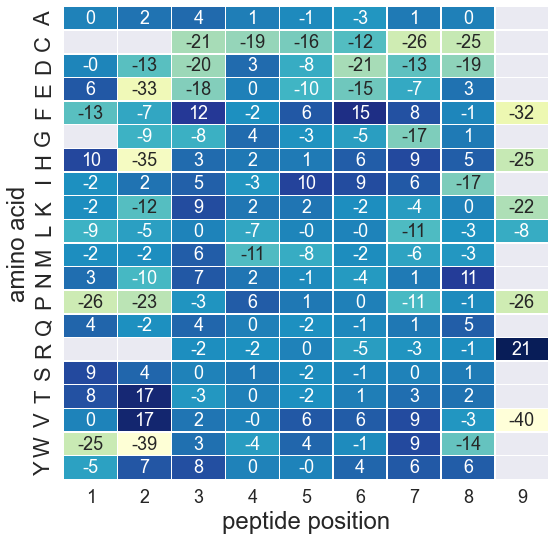

              1      2      3      4      5      6      7      8      9
H-phobic -0.095 -0.069  0.022 -0.019  0.019  0.021 -0.013 -0.045 -0.265
H-philic  0.036 -0.087 -0.030 -0.009 -0.034 -0.045 -0.029 -0.010 -0.087



HLA-A33:03 - decoys


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


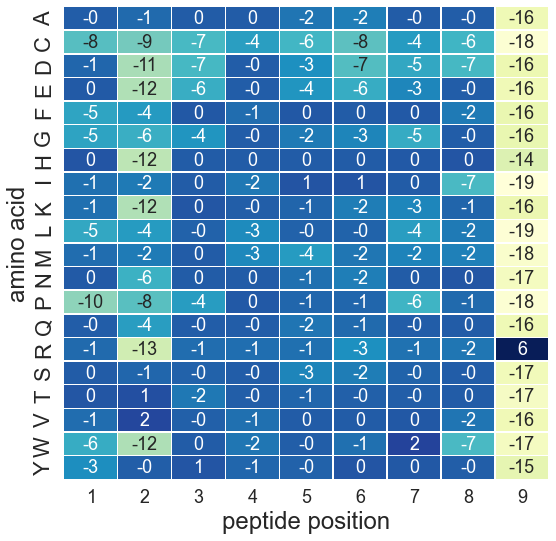

              1      2      3      4      5      6      7      8      9
H-phobic -0.038 -0.040 -0.009 -0.012 -0.009 -0.009 -0.018 -0.025 -0.172
H-philic -0.011 -0.072 -0.019 -0.006 -0.020 -0.028 -0.015 -0.013 -0.143
HLA-A36:01



HLA-A36:01 - all


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


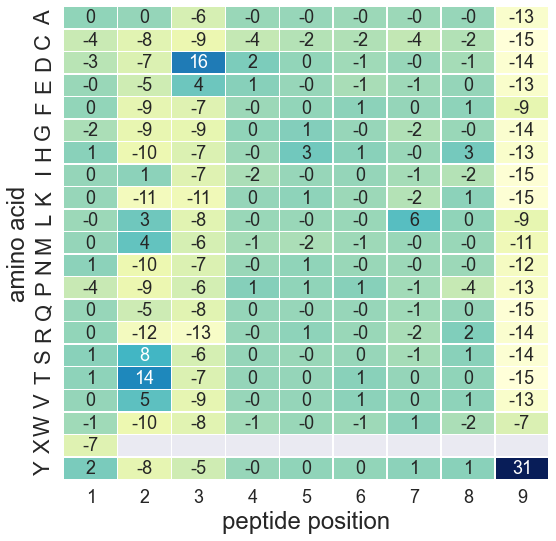

              1      2      3      4      5      6      7      8      9
H-phobic -0.006 -0.025 -0.073 -0.003  0.000  0.001  0.002 -0.007 -0.114
H-philic -0.001 -0.048 -0.048 -0.001  0.003 -0.003 -0.009  0.004 -0.101



HLA-A36:01 - hits


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


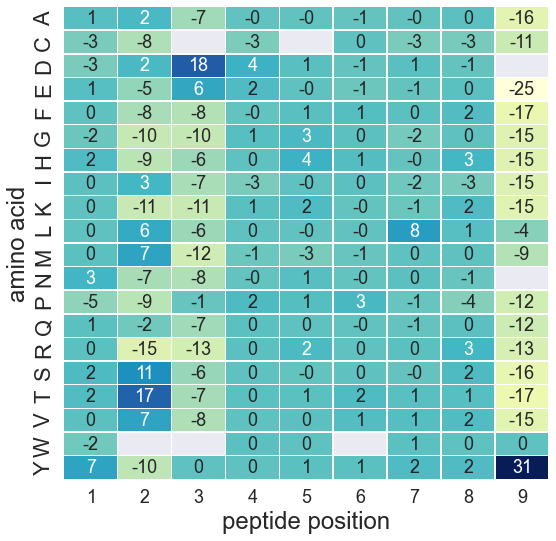

              1      2      3      4      5      6      7      8      9
H-phobic -0.007 -0.002 -0.075 -0.001  0.002  0.005  0.006 -0.003 -0.114
H-philic  0.011 -0.034 -0.033  0.004  0.011  0.001 -0.002  0.009 -0.103



HLA-A36:01 - decoys


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


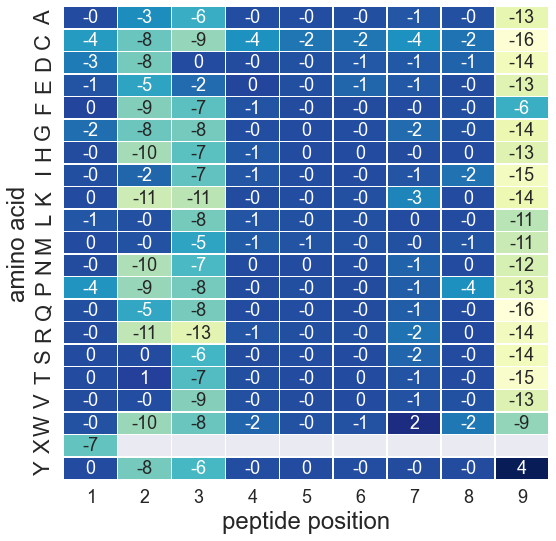

              1      2      3      4      5      6      7      8      9
H-phobic -0.008 -0.046 -0.074 -0.006 -0.002 -0.002 -0.004 -0.011 -0.115
H-philic -0.007 -0.069 -0.069 -0.005 -0.003 -0.005 -0.014 -0.003 -0.125
HLA-A74:01



HLA-A74:01 - all


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


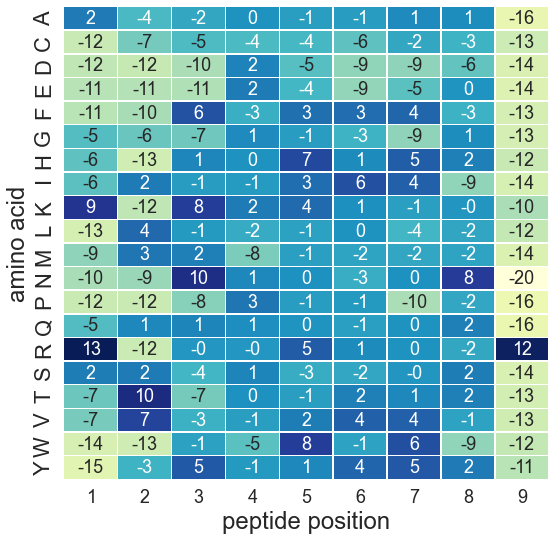

              1      2      3      4      5      6      7      8      9
H-phobic -0.083 -0.033 -0.017 -0.018  0.012  0.007 -0.005 -0.029 -0.136
H-philic -0.048 -0.060 -0.011  0.004 -0.000 -0.019 -0.005  0.006 -0.114



HLA-A74:01 - hits


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


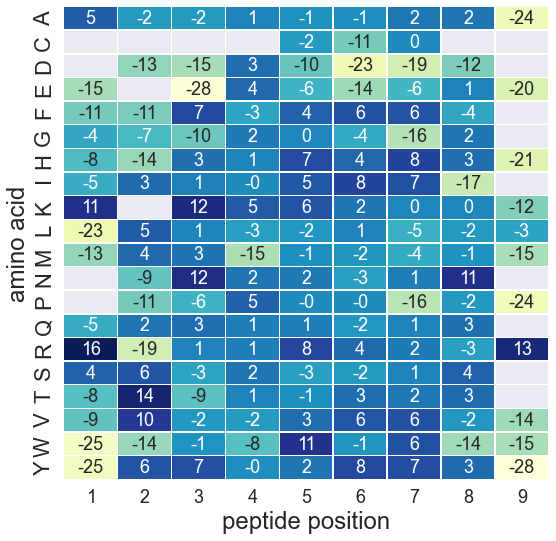

              1      2      3      4      5      6      7      8      9
H-phobic -0.107 -0.025 -0.010 -0.027  0.023  0.015 -0.016 -0.042 -0.159
H-philic -0.036 -0.034 -0.017  0.020  0.005 -0.032 -0.003  0.015 -0.137



HLA-A74:01 - decoys


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


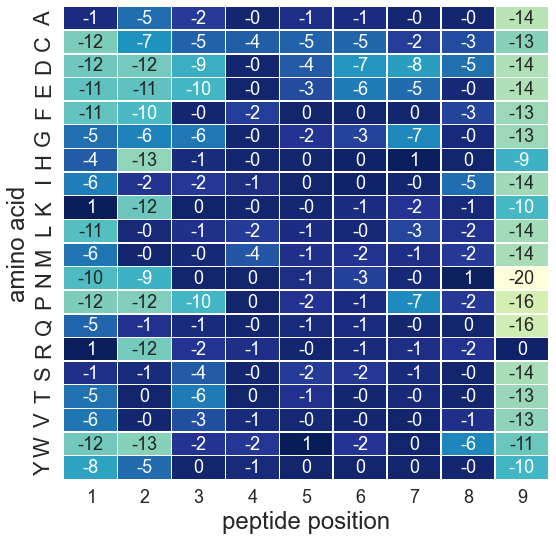

              1      2      3      4      5      6      7      8      9
H-phobic -0.077 -0.054 -0.029 -0.014 -0.007 -0.009 -0.020 -0.024 -0.136
H-philic -0.061 -0.075 -0.033 -0.006 -0.016 -0.023 -0.018 -0.010 -0.120
HLA-B37:01



HLA-B37:01 - all


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


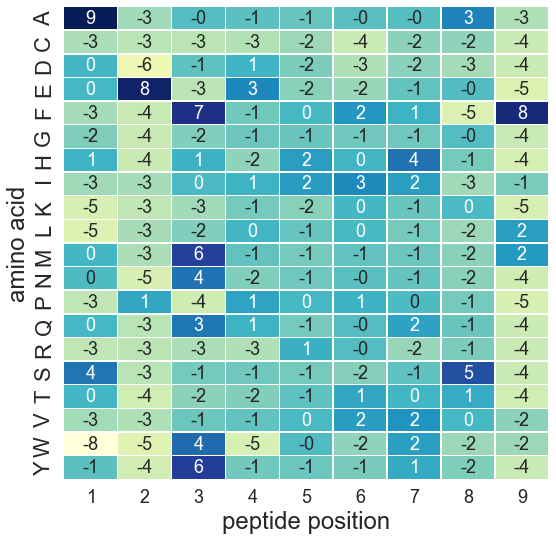

              1      2      3      4      5      6      7      8      9
H-phobic -0.018 -0.028  0.009 -0.007 -0.002  0.004  0.003 -0.014 -0.007
H-philic -0.006 -0.028 -0.002 -0.010 -0.010 -0.010 -0.002 -0.005 -0.041



HLA-B37:01 - hits


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


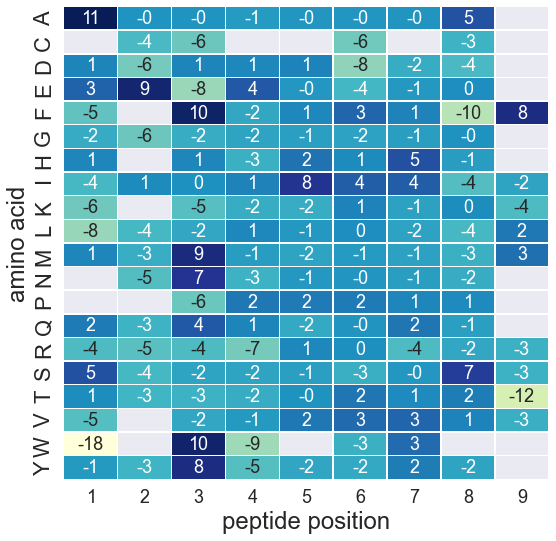

              1      2      3      4      5      6      7      8      9
H-phobic -0.038 -0.023  0.018 -0.012  0.011  0.007  0.009 -0.018  0.017
H-philic  0.002 -0.026 -0.005 -0.017 -0.004 -0.017 -0.001 -0.005 -0.056



HLA-B37:01 - decoys


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


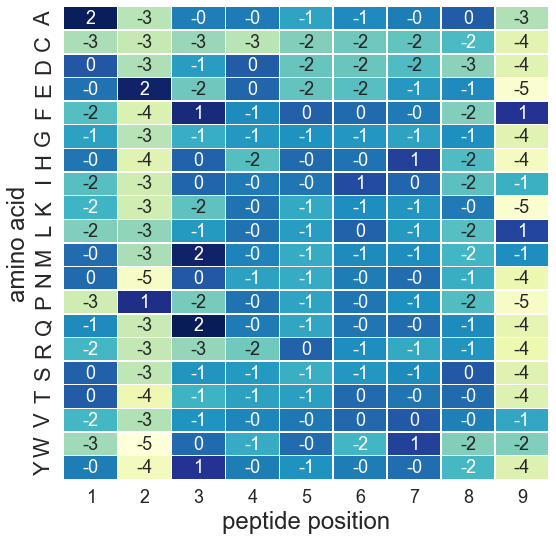

              1      2      3      4      5      6      7      8      9
H-phobic -0.015 -0.028 -0.003 -0.005 -0.006 -0.003 -0.003 -0.014 -0.017
H-philic -0.006 -0.032 -0.008 -0.010 -0.012 -0.008 -0.006 -0.010 -0.041
HLA-B46:01



HLA-B46:01 - all


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


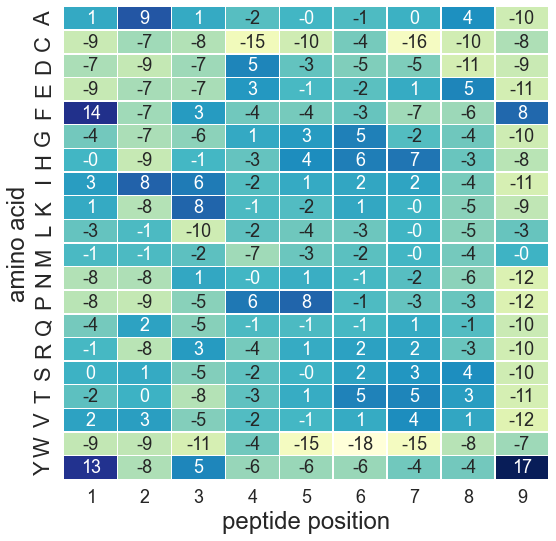

              1      2      3      4      5      6      7      8      9
H-phobic -0.006 -0.016 -0.032 -0.016 -0.017 -0.024 -0.024 -0.033 -0.063
H-philic -0.025 -0.055 -0.022 -0.025 -0.015 -0.002 -0.006 -0.029 -0.072



HLA-B46:01 - hits


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


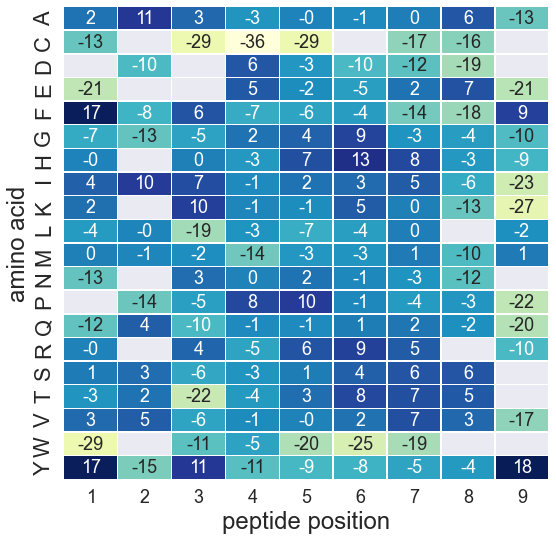

              1      2      3      4      5      6      7      8      9
H-phobic -0.015 -0.013 -0.034 -0.026 -0.022 -0.027 -0.029 -0.046 -0.096
H-philic -0.042 -0.032 -0.045 -0.048 -0.025  0.017 -0.006 -0.051 -0.115



HLA-B46:01 - decoys


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


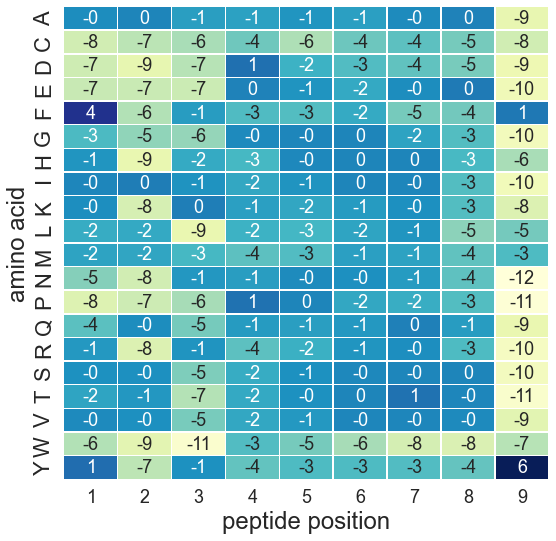

              1      2      3      4      5      6      7      8      9
H-phobic -0.020 -0.035 -0.047 -0.019 -0.018 -0.016 -0.021 -0.035 -0.069
H-philic -0.031 -0.059 -0.036 -0.019 -0.018 -0.014 -0.011 -0.025 -0.079
HLA-B58:01



HLA-B58:01 - all


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


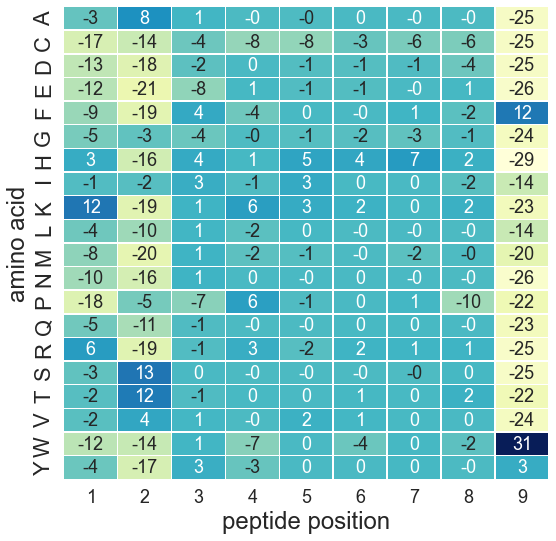

              1      2      3      4      5      6      7      8      9
H-phobic -0.070 -0.065  0.001 -0.013  0.003 -0.005 -0.002 -0.019 -0.110
H-philic -0.039 -0.114 -0.007 -0.002 -0.004  0.002  0.002 -0.001 -0.224



HLA-B58:01 - hits


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


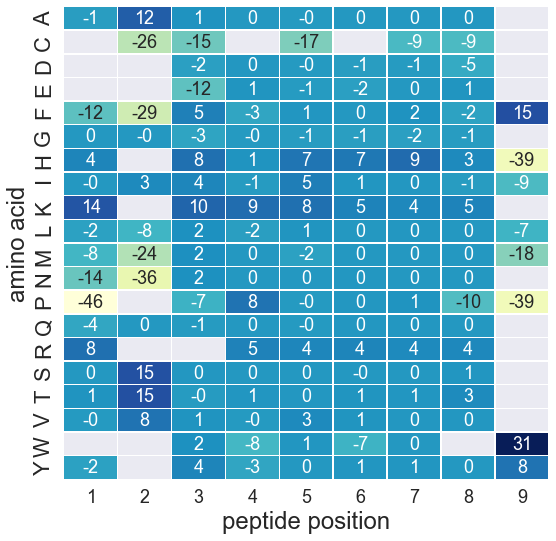

              1      2      3      4      5      6      7      8      9
H-phobic -0.088 -0.055  0.009 -0.007  0.008 -0.007  0.002 -0.016 -0.046
H-philic  0.010 -0.064 -0.005  0.014  0.001  0.015  0.008  0.002 -0.157



HLA-B58:01 - decoys


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


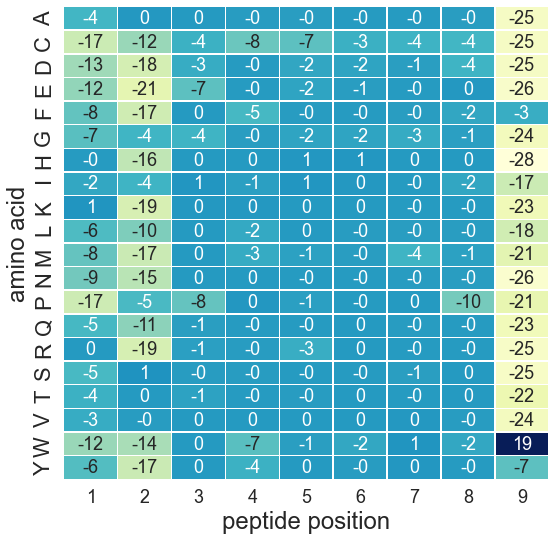

              1      2      3      4      5      6      7      8      9
H-phobic -0.074 -0.080 -0.012 -0.019 -0.004 -0.005 -0.008 -0.021 -0.148
H-philic -0.063 -0.133 -0.015 -0.012 -0.012 -0.005 -0.005 -0.008 -0.233
HLA-B58:02



HLA-B58:02 - all


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


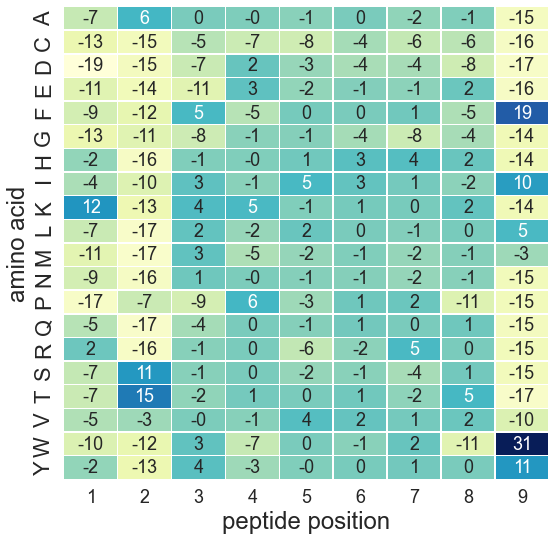

              1      2      3      4      5      6      7      8      9
H-phobic -0.091 -0.094 -0.001 -0.019  0.004  0.001 -0.007 -0.034  0.009
H-philic -0.056 -0.100 -0.021 -0.000 -0.021 -0.006 -0.009 -0.001 -0.128



HLA-B58:02 - hits


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


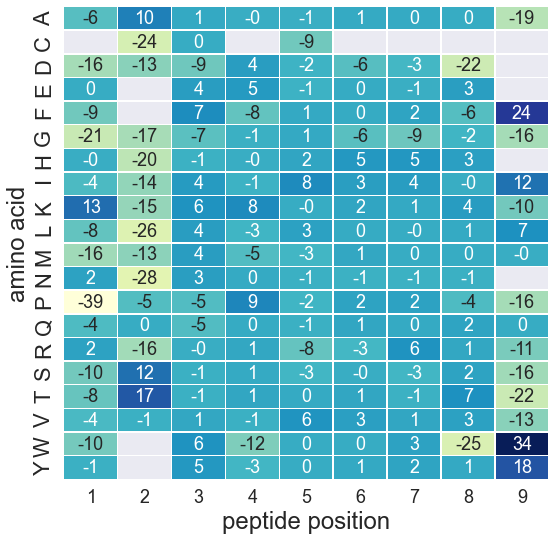

              1      2      3      4      5      6      7      8      9
H-phobic -0.130 -0.096  0.018 -0.024  0.014  0.006  0.004 -0.038  0.014
H-philic -0.022 -0.095  0.001  0.017 -0.021 -0.000  0.006 -0.000 -0.067



HLA-B58:02 - decoys


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


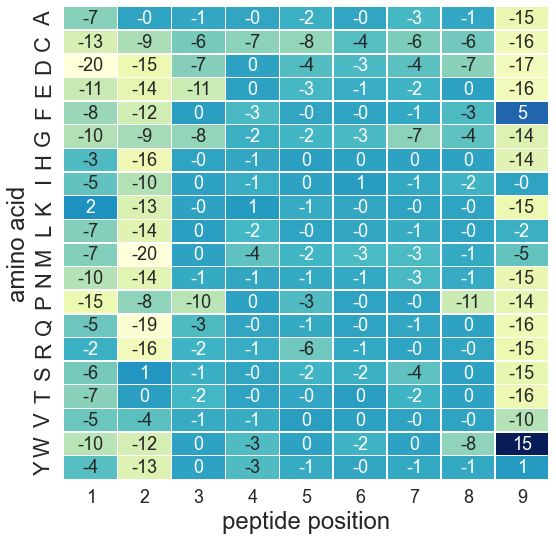

              1      2      3      4      5      6      7      8      9
H-phobic -0.082 -0.098 -0.021 -0.020 -0.011 -0.009 -0.018 -0.034 -0.043
H-philic -0.071 -0.117 -0.032 -0.012 -0.024 -0.011 -0.021 -0.014 -0.139
HLA-C15:02



HLA-C15:02 - all


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


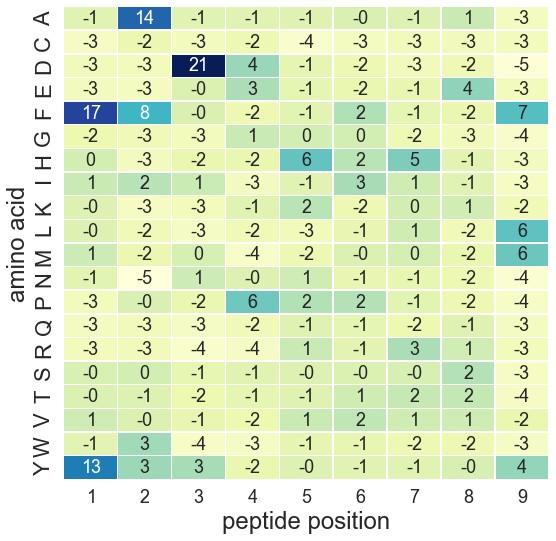

              1      2      3      4      5      6      7      8      9
H-phobic  0.014  0.023 -0.014 -0.012 -0.005  0.007 -0.005 -0.012  0.000
H-philic -0.003 -0.019  0.007 -0.007  0.002 -0.009 -0.001  0.001 -0.026



HLA-C15:02 - hits


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


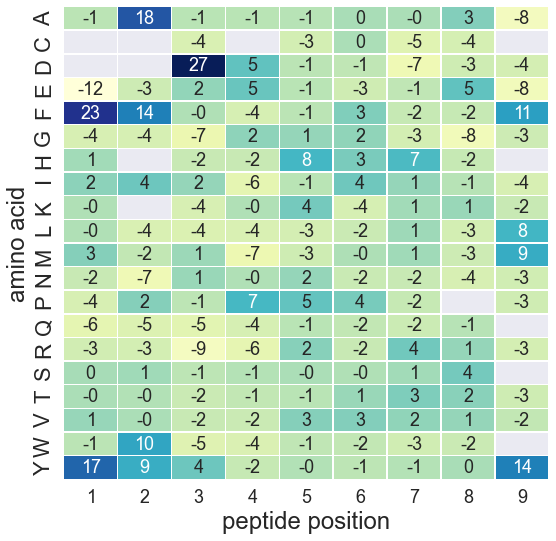

              1      2      3      4      5      6      7      8      9
H-phobic  0.020  0.044 -0.020 -0.020 -0.001  0.012 -0.006 -0.018  0.010
H-philic -0.006 -0.012  0.006 -0.007  0.007 -0.010 -0.003  0.001 -0.012



HLA-C15:02 - decoys


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


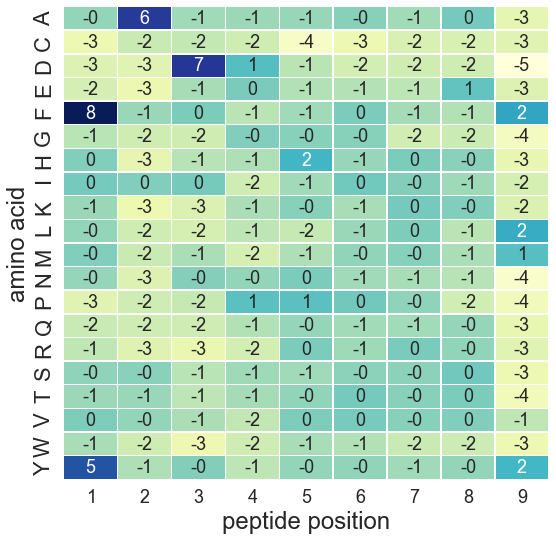

              1      2      3      4      5      6      7      8      9
H-phobic  0.003 -0.005 -0.013 -0.011 -0.005 -0.001 -0.007 -0.011 -0.013
H-philic -0.007 -0.021 -0.007 -0.008 -0.006 -0.010 -0.007 -0.005 -0.028
HLA-C17:01



HLA-C17:01 - all


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


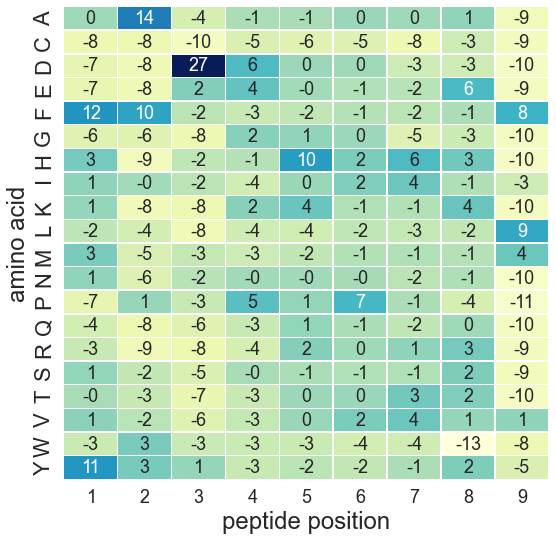

              1      2      3      4      5      6      7      8      9
H-phobic -0.001  0.011 -0.043 -0.015 -0.010  0.003 -0.009 -0.027 -0.020
H-philic -0.011 -0.059 -0.015 -0.007  0.008 -0.008 -0.009  0.014 -0.091



HLA-C17:01 - hits


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


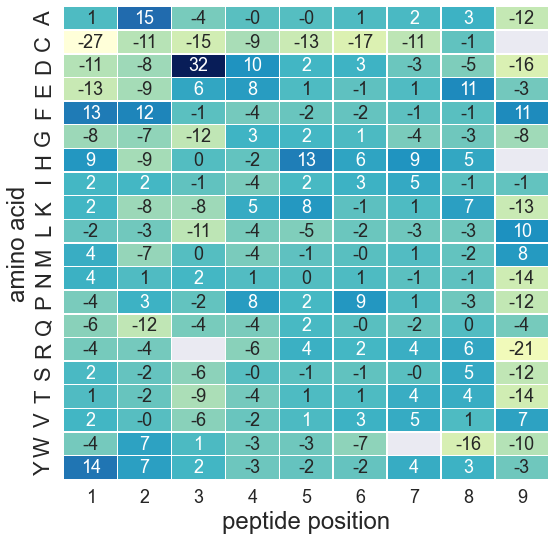

              1      2     3      4      5      6      7      8      9
H-phobic  0.006  0.024 -0.04 -0.013 -0.005  0.007  0.005 -0.026 -0.010
H-philic -0.027 -0.051 -0.00 -0.005  0.014 -0.008  0.006  0.032 -0.112



HLA-C17:01 - decoys


This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


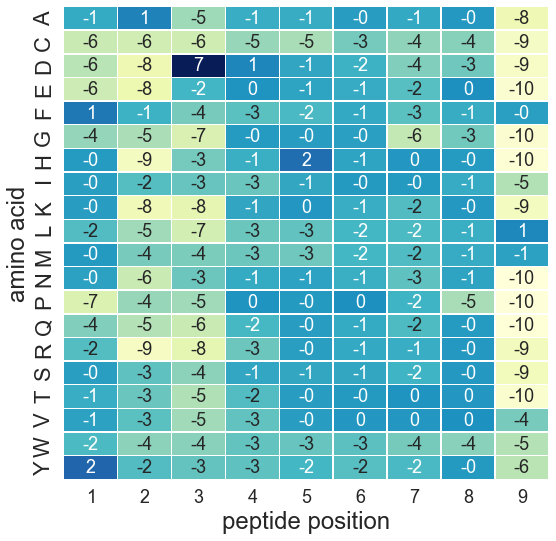

              1      2      3      4      5      6      7      8      9
H-phobic -0.018 -0.031 -0.047 -0.021 -0.015 -0.009 -0.021 -0.019 -0.047
H-philic -0.022 -0.062 -0.038 -0.016 -0.008 -0.013 -0.020 -0.007 -0.090


In [31]:
for mhc_allele_name in mhc_allele_names:
    print(f"{mhc_allele_name}")
    
    filename = f"{pMHC.OUTPUT_FOLDER}{SEP}shap{SEP}pics" \
                    + f"{SEP}shap_{mhc_allele_name.replace(':', '')}_{checkpoint}.csv"
    df = pd.read_csv(f"{filename}", sep=",")
    
    idx_all = list(range(0, df.shape[0], 1))
    idx_hits = list(range(0, df.shape[0], int(1 + decoys_per_obs)))
    idx_decoys = [x for x in idx_all if x not in idx_hits]
    
    for name, idx_sel in zip(["all", "hits", "decoys"], 
                             [idx_all, idx_hits, idx_decoys]):
        print(f"\n\n\n{mhc_allele_name} - {name}")
        list_peptides = df["peptides_list"].iloc[idx_sel]
        list_shap_values = df["shap_values_list"].iloc[idx_sel]
        filename = f"{pMHC.OUTPUT_FOLDER}{SEP}shap{SEP}pics" \
                    + f"{SEP}shap_{mhc_allele_name.replace(':', '')}_{checkpoint}_{name}"
        plot_AA_pos(list_peptides, 
                    list_shap_values,
                    filename)
        
        df_2 = pd.read_csv(f"{filename}_mean.csv").set_index("amino acid")
        
        df_phobic = df_2.loc[set(df_2.index).intersection(hydrophobic_aa)].mean()
        df_phobic.name = "H-phobic"
        df_philic = df_2.loc[set(df_2.index).intersection(hydrophilic_aa)].mean()
        df_philic.name = "H-philic"
        
        df_H = pd.concat([df_phobic, df_philic], axis=1).transpose()
        print(np.round(df_H, 3))

### scatter plot 

In [14]:
from matplotlib.ticker import StrMethodFormatter

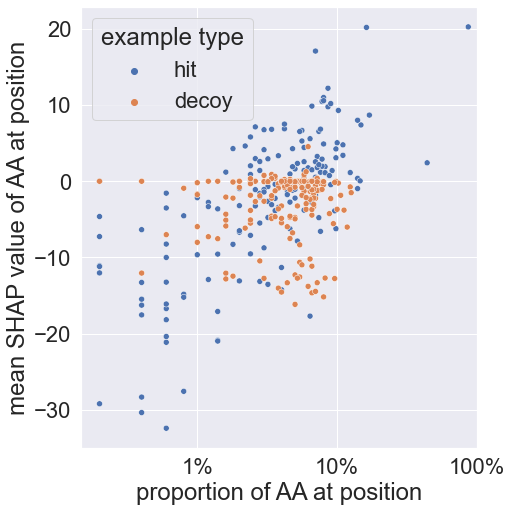

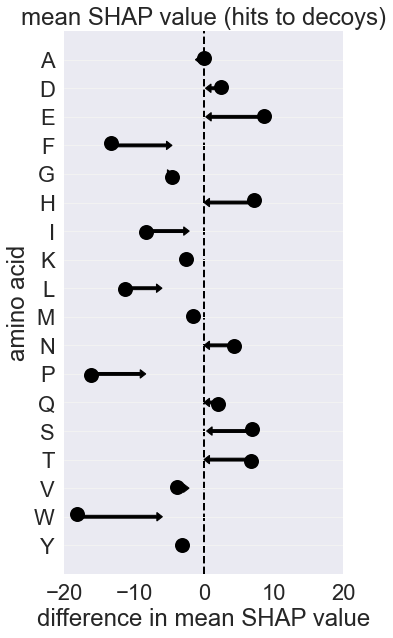

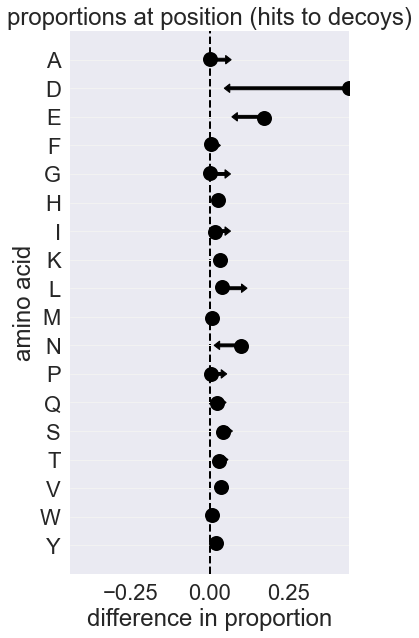

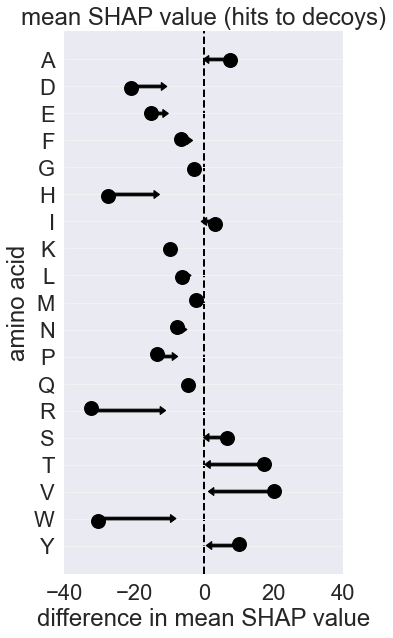

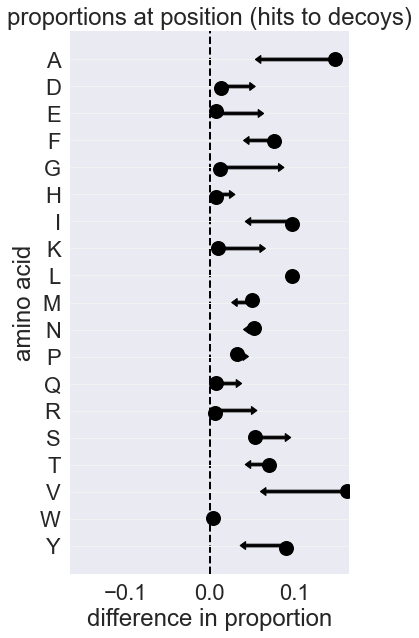

...

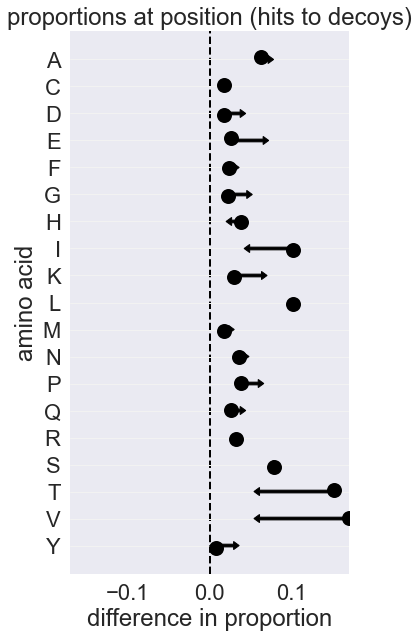

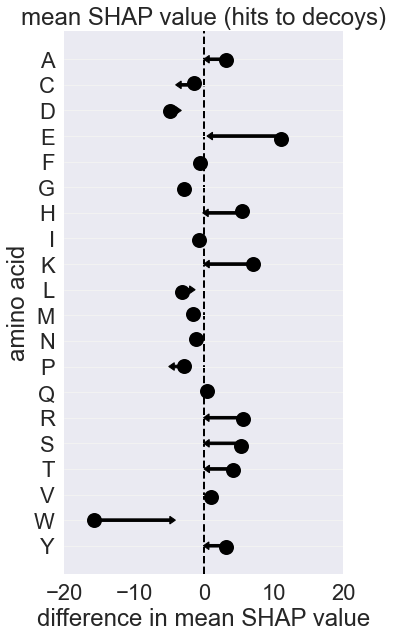

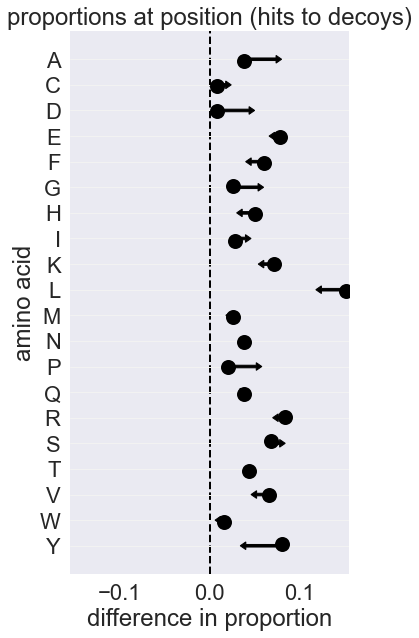

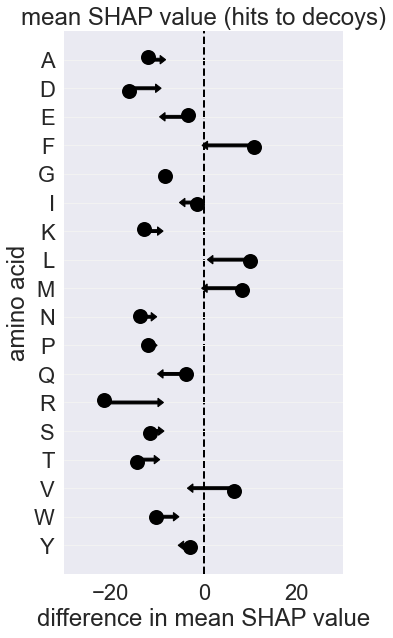

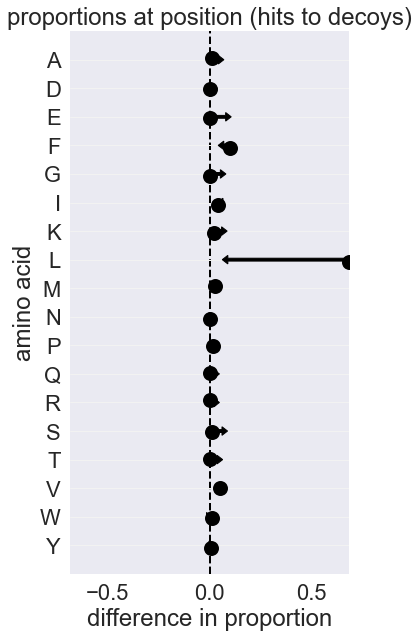

In [33]:
for mhc_allele_name in mhc_allele_names:
    filename_hits = f"{pMHC.OUTPUT_FOLDER}{SEP}shap{SEP}pics" \
                    + f"{SEP}shap_{mhc_allele_name.replace(':', '')}_{checkpoint}_hits_count_mean"
    filename_decoys = f"{pMHC.OUTPUT_FOLDER}{SEP}shap{SEP}pics" \
                    + f"{SEP}shap_{mhc_allele_name.replace(':', '')}_{checkpoint}_decoys_count_mean"
    
    df_hits = pd.read_csv(f"{filename_hits}.csv", sep=",")
    df_hits = df_hits.rename(columns={"value_x": "count", "value_y": "mean SHAP value of AA at position"})
    df_hits["proportion of AA at position"] = df_hits["count"]/num_observations
    df_hits["example type"] = "hit"
    df_decoys = pd.read_csv(f"{filename_decoys}.csv", sep=",")
    df_decoys = df_decoys.rename(columns={"value_x": "count", "value_y": "mean SHAP value of AA at position"})
    df_decoys["proportion of AA at position"] = df_decoys["count"]/(num_observations*decoys_per_obs)
    df_decoys["example type"] = "decoy"
    
    df_hits_decoys = pd.concat([df_hits, df_decoys], axis=0)
    df_hits_decoys["mean SHAP value of AA at position"] = 100*df_hits_decoys["mean SHAP value of AA at position"]
    
    fig = plt.figure(figsize=(7, 7), constrained_layout=True)
    splot = sns.scatterplot(data=df_hits_decoys, 
                            x="proportion of AA at position", 
                            y="mean SHAP value of AA at position", 
                            hue="example type")
    splot.set(xscale="log")
    splot.xaxis.set_major_formatter(StrMethodFormatter('{x:,.0%}'))
    splot.set(xlim=(None,1.))
    
    filename_scatter = f"{pMHC.OUTPUT_FOLDER}{SEP}shap{SEP}pics" \
                    + f"{SEP}shap_{mhc_allele_name.replace(':', '')}_{checkpoint}_scatter"
    plt.savefig(f"{filename_scatter}.pdf", format="pdf", bbox_inches='tight')
    plt.show()
    
    for p in range(1, 10):
        shap_plot_change(mhc_allele_name, checkpoint, p, df_hits_decoys)